# Data Cleaning: Transactions

In [31]:
import os
from typing import Union

import numpy as np
import pandas as pd
from helpers import CHARTS_DIR, RAW_DATA_DIR

import plotly.express as px
import plotly.graph_objects as go

In [2]:
df_transactions = pd.read_parquet(RAW_DATA_DIR / 'transactions_KL_ckpt1.parquet')
df_transactions

,project_name,spa_date,address,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price
0,BANDAR BARU SRI PETALING,2023-06-09,"✕✕✕, JALAN PIKRAMA",TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,nan,"2,196 ft²",nan,342,"750,000"
1,BANDAR BARU SRI PETALING,2023-06-01,"✕✕. ✕✕, JALAN PERLAK 3",TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,nan,753 ft²,nan,398,"300,000"
2,BANDAR BARU SRI PETALING,2023-05-29,"✕✕ ✕, JALAN 12/149L",TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2½,nan,"3,197 ft²",nan,188,"600,000"
3,BANDAR BARU SRI PETALING,2023-05-25,"✕✕. ✕✕✕, JALAN PASAI",TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,nan,753 ft²,nan,531,"400,000"
4,BANDAR BARU SRI PETALING,2023-05-22,"✕✕, JALAN SRI PETALING 5",SEMI-D,LEASEHOLD,2½,nan,"4,801 ft²",nan,250,"1,200,000"
...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,"✕✕✕-✕✕✕, BB WANGSA MAJU",FLAT,LEASEHOLD,1,2,493 ft²,493 ft²,71,"35,000"
294563,IDAMAN PUTERI,2005-01-10,"✕✕-✕, JALAN GOMBAK",CONDOMINIUM,FREEHOLD,1,3,1454 ft²,1454 ft²,150,"218,025"
294564,KELAB LE CHATEAU II,2008-02-25,"✕-✕✕-✕, JALAN KIARA 3",CONDOMINIUM,FREEHOLD,1,3,593 ft²,593 ft²,194,"115,000"
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,"✕-✕-✕, OFF JALAN SENTUL",APARTMENT,LEASEHOLD,1,2,1193 ft²,1193 ft²,197,"235,000"


In [3]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294567 entries, 0 to 294566
Data columns (total 11 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   project_name   294567 non-null  object        
 1   spa_date       294567 non-null  datetime64[ns]
 2   address        294546 non-null  object        
 3   building_type  294567 non-null  object        
 4   tenure         294567 non-null  object        
 5   floors         294567 non-null  object        
 6   rooms          294567 non-null  object        
 7   land_area      294567 non-null  object        
 8   built_up       294567 non-null  object        
 9   price_psf      294567 non-null  object        
 10  price          294567 non-null  object        
dtypes: datetime64[ns](1), object(10)
memory usage: 24.7+ MB


### Concluding Remarks from Data Exploration: Recap
1. How does each dataset look like? Is it in row format or it has merged cells?
    - It is in row format, with no merged cells.
2. What is the start and end of each dataset?
    - From 1909 to 2023
3. Is the dataset from the area of interest, Kuala Lumpur?
    - Yes
4. How is the data quality?
    - There are missing values in some columns (`built_up` and `rooms`). Need to decide to remove rows or impute.
    - Values in some columns (`land_area` and `built_up`) has unit of measurement like "ft2". Need to remove.
    - Values in `floors` column uses fraction instead of decimal. Need to change.
    - Values in numerical columns (`land_area`, `built_up`, `price_psf` and `price`) has comma. Need to remove.
    - Some values in some columns (`floors` and `rooms`) does not make sense. Need further investigation.
    - Only landed properties are in the dataset. Need another round of scraping for high rise real estate.

## Preparation

Selection:
1. Drop `address` column
2. Split `spa_date` to `year`, `month` and `day`

Cleaning:
1. Change fraction in `floors` column, i.e. 1/2 to .5
2. Remove comma in `price_psf`
3. Remove comma in `price`
4. Remove comma and ft2 in `land_area` and `built_up`
5. Remove 'acre' in `land_area` and convert into sqft
6. Investigate missing values in `built_up` and remove/impute
7. For `rooms` column:
    - Investigate missing values in `rooms` and remove/impute
    - Investigate weird `rooms` values (0 and 46) and remove/impute
8. Investigate weird `floors` values (0 and 99) and remove/impute

### Remove address column

In [4]:
# Removing address column
df_transactions = df_transactions.drop(columns=['address'])
df_transactions

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,nan,"2,196 ft²",nan,342,"750,000"
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,nan,753 ft²,nan,398,"300,000"
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2½,nan,"3,197 ft²",nan,188,"600,000"
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,nan,753 ft²,nan,531,"400,000"
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2½,nan,"4,801 ft²",nan,250,"1,200,000"
...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1,2,493 ft²,493 ft²,71,"35,000"
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1,3,1454 ft²,1454 ft²,150,"218,025"
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1,3,593 ft²,593 ft²,194,"115,000"
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1,2,1193 ft²,1193 ft²,197,"235,000"


In [5]:
df_transactions['year'] = df_transactions['spa_date'].dt.year
df_transactions['month'] = df_transactions['spa_date'].dt.month
df_transactions['day'] = df_transactions['spa_date'].dt.day

df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294567 entries, 0 to 294566
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   project_name   294567 non-null  object        
 1   spa_date       294567 non-null  datetime64[ns]
 2   building_type  294567 non-null  object        
 3   tenure         294567 non-null  object        
 4   floors         294567 non-null  object        
 5   rooms          294567 non-null  object        
 6   land_area      294567 non-null  object        
 7   built_up       294567 non-null  object        
 8   price_psf      294567 non-null  object        
 9   price          294567 non-null  object        
 10  year           294567 non-null  int32         
 11  month          294567 non-null  int32         
 12  day            294567 non-null  int32         
dtypes: datetime64[ns](1), int32(3), object(9)
memory usage: 25.8+ MB


### Change fraction to decimal

In [6]:
# Change fraction to decimal
from helpers import convert_mixed_fraction_to_decimal

df_transactions['floors'] = df_transactions['floors'].apply(lambda x: convert_mixed_fraction_to_decimal(x))
df_transactions

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,nan,"2,196 ft²",nan,342,"750,000",2023,6,9
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,nan,753 ft²,nan,398,"300,000",2023,6,1
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,nan,"3,197 ft²",nan,188,"600,000",2023,5,29
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,nan,753 ft²,nan,531,"400,000",2023,5,25
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,nan,"4,801 ft²",nan,250,"1,200,000",2023,5,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1,2,493 ft²,493 ft²,71,"35,000",1990,11,13
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1,3,1454 ft²,1454 ft²,150,"218,025",2005,1,10
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1,3,593 ft²,593 ft²,194,"115,000",2008,2,25
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1,2,1193 ft²,1193 ft²,197,"235,000",2009,8,10


### Remove commas

In [7]:
# Change nan to NaN to ease processing
df_transactions = df_transactions.replace('nan', np.nan)
df_transactions

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,NaN,"2,196 ft²",NaN,342,"750,000",2023,6,9
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753 ft²,NaN,398,"300,000",2023,6,1
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,NaN,"3,197 ft²",NaN,188,"600,000",2023,5,29
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753 ft²,NaN,531,"400,000",2023,5,25
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,NaN,"4,801 ft²",NaN,250,"1,200,000",2023,5,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1,2,493 ft²,493 ft²,71,"35,000",1990,11,13
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1,3,1454 ft²,1454 ft²,150,"218,025",2005,1,10
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1,3,593 ft²,593 ft²,194,"115,000",2008,2,25
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1,2,1193 ft²,1193 ft²,197,"235,000",2009,8,10


In [8]:
# Remove commas from numeric columns
columns_with_comma = ['price_psf', 'price', 'land_area', 'built_up', 'rooms']

for column in columns_with_comma:
    df_transactions[column] = df_transactions[column].apply(
        lambda x: x if pd.isna(x) else x.replace(',', '')
    )

df_transactions

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,NaN,2196 ft²,NaN,342,750000,2023,6,9
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753 ft²,NaN,398,300000,2023,6,1
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,NaN,3197 ft²,NaN,188,600000,2023,5,29
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753 ft²,NaN,531,400000,2023,5,25
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,NaN,4801 ft²,NaN,250,1200000,2023,5,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1,2,493 ft²,493 ft²,71,35000,1990,11,13
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1,3,1454 ft²,1454 ft²,150,218025,2005,1,10
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1,3,593 ft²,593 ft²,194,115000,2008,2,25
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1,2,1193 ft²,1193 ft²,197,235000,2009,8,10


### Remove units

In [9]:
# Remove units from numeric columns
columns_with_ft2 = ['land_area', 'built_up']

for column in columns_with_ft2:
    df_transactions[column] = df_transactions[column].apply(
        lambda x: x if pd.isna(x) else x.replace(' ft²', '')
    )

df_transactions

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,NaN,2196,NaN,342,750000,2023,6,9
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753,NaN,398,300000,2023,6,1
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,NaN,3197,NaN,188,600000,2023,5,29
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753,NaN,531,400000,2023,5,25
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,NaN,4801,NaN,250,1200000,2023,5,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1,2,493,493,71,35000,1990,11,13
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1,3,1454,1454,150,218025,2005,1,10
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1,3,593,593,194,115000,2008,2,25
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1,2,1193,1193,197,235000,2009,8,10


In [10]:
# Remove units from numeric columns
columns_with_acre = ['land_area', 'built_up']

for column in columns_with_acre:
    acre_index = df_transactions[df_transactions[column].apply(lambda x: not str(x).isdigit())].index
    df_transactions[column] = df_transactions[column].apply(
        lambda x: x if pd.isna(x) else x.replace(' acre', '')
    )
    df_transactions.loc[acre_index, column] = df_transactions.loc[acre_index, column].apply(
        lambda x: float(x) * 43560
    )

df_transactions

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,NaN,2196,NaN,342,750000,2023,6,9
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753,NaN,398,300000,2023,6,1
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,NaN,3197,NaN,188,600000,2023,5,29
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753,NaN,531,400000,2023,5,25
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,NaN,4801,NaN,250,1200000,2023,5,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1,2,493,493,71,35000,1990,11,13
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1,3,1454,1454,150,218025,2005,1,10
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1,3,593,593,194,115000,2008,2,25
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1,2,1193,1193,197,235000,2009,8,10


In [11]:
type_conversion = {
    'project_name': 'category',
    'building_type': 'category',
    'tenure': 'category',
    'floors': 'float',
    'rooms': 'float',
    'land_area': 'float',
    'built_up': 'float',
    'price_psf': 'float',
    'price': 'float'
}

for column, dtype in type_conversion.items():
    df_transactions[column] = df_transactions[column].astype(dtype)

df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294567 entries, 0 to 294566
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   project_name   294567 non-null  category      
 1   spa_date       294567 non-null  datetime64[ns]
 2   building_type  294567 non-null  category      
 3   tenure         294567 non-null  category      
 4   floors         294567 non-null  float64       
 5   rooms          263897 non-null  float64       
 6   land_area      294567 non-null  float64       
 7   built_up       288954 non-null  float64       
 8   price_psf      294567 non-null  float64       
 9   price          294567 non-null  float64       
 10  year           294567 non-null  int32         
 11  month          294567 non-null  int32         
 12  day            294567 non-null  int32         
dtypes: category(3), datetime64[ns](1), float64(6), int32(3)
memory usage: 20.3 MB


### Investigate outliers

We want to remove outliers in the numeric features before investigating missing values. Assumptions made are:
1. The features `floors` and `rooms` are physically dependent on `land_area` and `built_up` - the larger the area, the more floors and rooms it can have.
2. The feature `price` is dependent on `price_psf` and `built_up` or `land_area` - the larger the area, the more expensive it is.

In [12]:
df_transactions.describe()

,spa_date,floors,rooms,land_area,built_up,price_psf,price,year,month,day
count,294567,294567.000000,263897.000000,294567.000000,288954.000000,294567.000000,2.945670e+05,294567.000000,294567.000000,294567.00000
mean,2009-07-08 23:35:02.056238592,1.263222,3.004490,1607.128229,1269.061401,340.512243,5.555355e+05,2008.994137,6.821752,16.05446
min,1909-05-11 00:00:00,0.000000,0.000000,60.000000,0.000000,1.000000,4.800000e+03,1909.000000,1.000000,1.00000
25%,2004-06-10 00:00:00,1.000000,3.000000,816.000000,806.000000,153.000000,1.550000e+05,2004.000000,4.000000,8.00000
50%,2010-11-11 00:00:00,1.000000,3.000000,1103.000000,1060.000000,264.000000,3.100000e+05,2010.000000,7.000000,16.00000
75%,2015-06-25 00:00:00,1.000000,3.000000,1561.000000,1454.000000,446.000000,6.000000e+05,2015.000000,10.000000,24.00000
max,2023-06-19 00:00:00,99.000000,1992.000000,618552.000000,285600.000000,9892.000000,1.180000e+08,2023.000000,12.000000,31.00000
std,NaN,0.665659,4.139757,4542.447745,1284.805885,273.258392,1.052342e+06,8.480388,3.369222,8.78145


Most outlier detection methods only work on continuous data, therefore ordinal data such as `floors` and `rooms` will not be included in the outlier detection.

The `price` feature will be excluded as well because it is dependent on `price_psf` and `built_up` or `land_area`.

In [13]:
px.scatter(df_transactions, x='land_area', y='built_up', color='building_type').write_html(CHARTS_DIR / 'land_area_vs_built_up.html')

d:\Repos\GitHub\time-series-house-price-forecasting\venv\Lib\site-packages\plotly\express\_core.py:2044: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df.groupby(required_grouper, sort=False)  # skip one_group groupers


#### Detecting outlier using IQR method

In [14]:
numeric_columns = ['land_area', 'built_up', 'price_psf']
outliers_info = []

for var in numeric_columns:
    Q1 = df_transactions[var].quantile(0.25)
    Q3 = df_transactions[var].quantile(0.75)
    IQR = Q3 - Q1

    number_of_outliers = ((df_transactions[var] < (Q1 - 1.5 * IQR)) | (df_transactions[var] > (Q3 + 1.5 * IQR))).sum()
    outliers_info.append([
            var,
            number_of_outliers,
            number_of_outliers / len(df_transactions[var]) * 100,
            Q1 - 1.5 * IQR,
            Q3 + 1.5 * IQR,
            Q1,
            Q3,
            IQR
        ])
    
pd.DataFrame(outliers_info, columns=['column', 'number_of_outliers', 'percentage_of_outliers', 'lower_bound', 'upper_bound', 'Q1', 'Q3', 'IQR'])

,column,number_of_outliers,percentage_of_outliers,lower_bound,upper_bound,Q1,Q3,IQR
0,land_area,25262,8.575978,-301.5,2678.5,816.0,1561.0,745.0
1,built_up,20256,6.876534,-166.0,2426.0,806.0,1454.0,648.0
2,price_psf,12958,4.398999,-286.5,885.5,153.0,446.0,293.0


Looking at the upper bounds for `land_area`, `built_up` and `price_psf`, they seemed unrealistic. Therefore, we need to visualise it in a chart.

In [15]:
len(df_transactions[df_transactions['built_up'].notna()].query('land_area > 2678.5 | built_up > 2426.0 | price_psf > 885.5')) / len(df_transactions) * 100

13.142680612560131

In [16]:
len(df_transactions[df_transactions['built_up'].notna()].query('land_area > 2678.5 | built_up > 2426.0').dropna()) / len(df_transactions) * 100

9.45387636768545

In [17]:
def plot_outliers(X, outlier_labels):
    df = pd.DataFrame({
        'land_area': X['land_area'],
        'built_up': X['built_up'],
        'outlier': outlier_labels
    })

    return px.scatter(df, x='land_area', y='built_up', color='outlier')

In [18]:
outlier_labels = [True if (row['land_area'] > 2678.5 or row['built_up'] > 2426.0) else False for _, row in df_transactions.iterrows()]
len(outlier_labels)

294567

In [20]:
fig = plot_outliers(df_transactions[['land_area', 'built_up']], outlier_labels)
fig.write_html(CHARTS_DIR / 'land_area_vs_built_up_iqr_outliers.html')

Based on the plot above, the outliers does not seem realistic. Therefore, IQR method is not suitable in this use case.

Moreover, the IQR method labelled 13% of the total data as outliers. This is a lot of data to be removed. Therefore, we will use the Z-score method to detect outliers. Bur first we need to check if the data is normally distributed.

In [21]:
px.histogram(df_transactions, x='land_area', nbins=100).write_html(CHARTS_DIR / 'land_area_histogram.html')

In [22]:
px.histogram(df_transactions, x='built_up', nbins=100).write_html(CHARTS_DIR / 'built_up_histogram.html')

In [23]:
px.histogram(df_transactions, x='price_psf', nbins=100).write_html(CHARTS_DIR / 'price_psf_histogram.html')

Based on the histogram above, all three features are not normally distributed. But let's double check using Shapiro Wilk test and Anderson test.

In [24]:
from scipy.stats import shapiro

results = []

for var in numeric_columns:
    shapiro_result = shapiro(df_transactions[var].dropna())

    results.append([var, shapiro_result.statistic, shapiro_result.pvalue])

pd.DataFrame(results, columns=['column', 'statistic', 'pvalue'])

d:\Repos\GitHub\time-series-house-price-forecasting\venv\Lib\site-packages\scipy\stats\_morestats.py:1882: UserWarning:

p-value may not be accurate for N > 5000.



,column,statistic,pvalue
0,land_area,0.109433,0.0
1,built_up,0.302720,0.0
2,price_psf,0.803371,0.0


For all three features, the p-value is less than 0.05, therefore we can reject the null hypothesis that the data is normally distributed.

Shapiro-Wilk test suggests that the data is not normally distributed.

In [26]:
from scipy.stats import anderson

results = []

for var in numeric_columns:
    anderson_result = anderson(df_transactions[var].dropna())

    for sl, cv in zip(anderson_result.significance_level, anderson_result.critical_values):
        results.append([var, sl, cv, anderson_result.statistic < cv, 'Normal' if anderson_result.statistic < cv else 'Not Normal'])

pd.DataFrame(results, columns=['column', 'significance_level', 'critical_value', 'is_normal', 'distribution'])

,column,significance_level,critical_value,is_normal,distribution
0,land_area,15.0,0.576,False,Not Normal
1,land_area,10.0,0.656,False,Not Normal
2,land_area,5.0,0.787,False,Not Normal
3,land_area,2.5,0.918,False,Not Normal
4,land_area,1.0,1.092,False,Not Normal
5,built_up,15.0,0.576,False,Not Normal
6,built_up,10.0,0.656,False,Not Normal
7,built_up,5.0,0.787,False,Not Normal
8,built_up,2.5,0.918,False,Not Normal
9,built_up,1.0,1.092,False,Not Normal


Anderson-Darling test also suggests that all three features are not normally distributed. Therefore, we cannot use Z-score method to detect outliers.

However, we can try clustering method to detect outliers.

#### Detecting outliers using clustering method

In [27]:
def plot(X, cluster_labels):
    df = pd.DataFrame({
        'land_area': X[:, 0],
        'built_up': X[:, 1],
        'cluster': cluster_labels})

    return px.scatter(df, x='land_area', y='built_up', color='cluster')

In [28]:
from sklearn.cluster import DBSCAN

X = df_transactions[['land_area', 'built_up']].dropna().to_numpy()

if not os.path.exists(CHARTS_DIR / 'land_area_vs_built_up_dbscan_outliers.html'):
    dbscan = DBSCAN(min_samples=5).fit(X)

    fig = plot(X, dbscan.labels_)
    fig.write_html(CHARTS_DIR / 'land_area_vs_built_up_dbscan_outliers.html')

The detected outliers does not make sense.

In [29]:
from sklearn.cluster import HDBSCAN

if not os.path.exists(CHARTS_DIR / 'land_area_vs_built_up_hdbscan_outliers.html'):
    hdbscan = HDBSCAN(min_samples=5).fit(X)

    fig = plot(X, hdbscan.labels_)
    fig.write_html(CHARTS_DIR / 'land_area_vs_built_up_hdbscan_outliers.html')

The detected outliers does not make sense.

In [30]:
from sklearn.cluster import Birch

if not os.path.exists(CHARTS_DIR / 'land_area_vs_built_up_birch_outliers.html'):
    birch = Birch(n_clusters=4).fit(X)

    fig = plot(X, birch.labels_)
    fig.write_html(CHARTS_DIR / 'land_area_vs_built_up_birch_outliers.html')

The transactions labelled in cluster 1 are the outliers.

In [34]:
from sklearn.cluster import KMeans

if not os.path.exists(CHARTS_DIR / 'land_area_vs_built_up_kmeans_outliers.html'):
    kmeans = KMeans(n_clusters=4, random_state=1234).fit(X)

    fig = plot(X, kmeans.labels_)
    fig.write_html(CHARTS_DIR / 'land_area_vs_built_up_kmeans_outliers.html')

d:\Repos\GitHub\time-series-house-price-forecasting\venv\Lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



The transactions labelled in cluster 3 are the outliers.

Comparing Birch and KMeans, KMeans labelled more outliers than Birch:
1. Birch labelled transactions with `land_area` > 280k as outliers
2. KMeans labelled transactions with `land_area` > 200k as outliers

The clusters labelled by KMeans is visually better segregated. Therefore we will use KMeans to label the outliers.

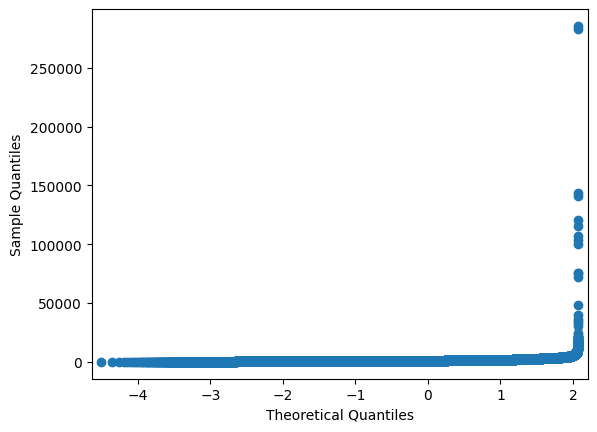

In [71]:
from statsmodels.graphics.gofplots import qqplot

var = 'built_up'
qqplot_data = qqplot(df_transactions[var], line='s').gca().lines

### Investigate missing values

In [12]:
print(
    f"Number of rows with missing values: {df_transactions['built_up'].isna().sum()}",
    f"\nPercentage of missing values: {df_transactions['built_up'].isna().sum() / len(df_transactions) * 100}",
)

Number of rows with missing values: 5613 
Percentage of missing values: 1.9055087637108028


In [13]:
df_transactions[df_transactions['built_up'].isna()]

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1.0,NaN,2196.0,NaN,342.0,750000.0,2023,6,9
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,NaN,753.0,NaN,398.0,300000.0,2023,6,1
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,NaN,3197.0,NaN,188.0,600000.0,2023,5,29
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,NaN,753.0,NaN,531.0,400000.0,2023,5,25
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,NaN,4801.0,NaN,250.0,1200000.0,2023,5,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...
76747,TAMAN NAM FONG,2023-03-06,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,NaN,1540.0,NaN,325.0,500000.0,2023,3,6
76748,TAMAN NAM FONG,2021-03-03,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,NaN,1032.0,NaN,618.0,638000.0,2021,3,3
76749,TAMAN NAM FONG,2020-12-02,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,NaN,1540.0,NaN,409.0,630000.0,2020,12,2
76761,LAMAN BAYU,2023-04-26,BUNGALOW,FREEHOLD,3.0,NaN,4553.0,NaN,703.0,3200000.0,2023,4,26


It seems that for transactions with missing `built_up` has missing values for `rooms` too.

In [14]:
df_transactions[df_transactions['built_up'].isna()]['rooms'].isna().sum()

5612

Out of 5613 with missing `built_up`, 5612 has missing `rooms`.

In [15]:
df_transactions[df_transactions['built_up'].isna()]['year'].value_counts().sort_index()

year
2000       1
2009       1
2011       1
2012       1
2015       1
2017       2
2018      11
2019      35
2020    1106
2021    1895
2022    2001
2023     558
Name: count, dtype: int64

In [16]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['year'].value_counts(), text_auto=True).write_html(CHARTS_DIR / 'missing_builtup_by_year.html')

Missing `built_up` values mostly happened from year 2000 onwards.

In [17]:
df_transactions[df_transactions['built_up'].isna()]['project_name'].value_counts()

project_name
BANDAR BARU SRI PETALING               261
TAMAN TUN DR ISMAIL                    209
DAMANSARA HEIGHTS (BUKIT DAMANSARA)    165
KEPONG BARU                            140
TAMAN BUKIT MALURI                     136
                                      ... 
KOBENA APARTMENT                         0
KM1 WEST                                 0
KM1 EAST                                 0
KL TRILLION                              0
ZETA DESKYE                              0
Name: count, Length: 1879, dtype: int64

In [18]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['project_name'].value_counts(), text_auto=True).write_html(CHARTS_DIR / 'missing_builtup_by_project.html')

Missing values scatter around a number of projects, not just specific to one. Hence missing values could be due to human error.

In [19]:
df_transactions[df_transactions['built_up'].isna()]['building_type'].value_counts()

building_type
TERRACE HOUSE - INTERMEDIATE     3318
BUNGALOW                          667
SEMI-D                            489
TERRACE HOUSE - CORNER LOT        360
TERRACE HOUSE - END LOT           302
TOWN HOUSE                        290
CLUSTER HOUSE - INTERMEDIATE      151
CLUSTER HOUSE                      23
CLUSTER HOUSE - END LOT            13
APARTMENT                           0
CLUSTER HOUSE - CORNER LOT          0
CONDOMINIUM                         0
CONDOMINIUM - CLUB                  0
CONDOMINIUM - RESIDENTIAL USE       0
FLAT                                0
SERVICE RESIDENCE                   0
Name: count, dtype: int64

The missing values are all from landed properties. Terrace house has the most missing values followed by bungalow and semi-D.

In [20]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['land_area'].value_counts().sort_index()).update_traces(dict(marker_line_width=0)).write_html(CHARTS_DIR / 'missing_builtup_by_landarea.html')

The missing values are not only from specific group of land_area. 

In [21]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['tenure'].value_counts(), text_auto=True).write_html(CHARTS_DIR / 'missing_builtup_by_tenure.html')

There are more missing values in `build_up` for freehold properties than leasehold. Could be also due to the fact that there are more freehold properties in the dataset.

In [22]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['floors'].value_counts(), text_auto=True).update_xaxes(tickmode='linear').write_html(CHARTS_DIR / 'missing_builtup_by_floors.html')

Most of the missing values are from 2 floor properties. However, 3 floor properties are the majority in the dataset, followed by 2 floor properties.

In [23]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['price'].value_counts()).update_traces(dict(marker_line_width=0)).write_html(CHARTS_DIR / 'missing_builtup_by_price.html')

Most of the missing values are from 500k and 1.1mil properties.

In [24]:
px.bar(df_transactions[df_transactions['built_up'].isna()]['price_psf'].value_counts()).update_traces(dict(marker_line_width=0)).write_html(CHARTS_DIR / 'missing_builtup_by_psf.html')

The investigation conducted on the transactions with missing `built_up` values versus other features revealed that the missing values are missing completely at random (MCAR), where the values are missing independently of other features.

Imputation strategy:
1. Random forest imputation (Jager et al., 2021) for MCAR, MAR and MNAR data in various domain
2. Multiple imputation by deterministic regression (Donlen, 2022) for MCAR data in real estate domain
3. MissForest (Waljee et al., 2013) for MCAR data in medical domain
4. Predictive mean matching, PMM (Heidt, 2019) for MAR data in medical domain
5. KNN imputation (Jadhav et al., 2019) for MCAR, MAR and MNAR data in UCI dataset

- Jager et al. (2021): https://www.frontiersin.org/articles/10.3389/fdata.2021.693674/full
- Donlen (2022): https://egrove.olemiss.edu/cgi/viewcontent.cgi?article=3744&context=hon_thesis
- Waljee et al. (2013): https://bmjopen.bmj.com/content/3/8/e002847.citation-tools
- Heidt (2019): https://dc.etsu.edu/cgi/viewcontent.cgi?article=5014&context=etd
- Jadhav et al (2019): https://www.tandfonline.com/doi/full/10.1080/08839514.2019.1637138

Based on the literature, we will explore:
1. Multiple imputation by deterministic regression
2. Random forest imputation
3. KNN imputation

But first, we find the correlation of the data points with respect to the features with missing values: `built_up` and `rooms`. The `built_up` is a continuous variable while `rooms` is a categorical variable, therefore, different correlation methods are used:
1. Target variable: `built_up` (continuous)
    - Continuous variables - Pearson correlation: `land_area`, `price_psf`, `price` (Khamis, 2008)
    - Nominal variables - Kruskal-Wallis: `project_name`, `building_type`, `tenure` (Scipy documentation; Gonzalez-Chica, 2015)
    - Ordinal variables - Spearman and Kendall correlation: `floors`, `rooms`, `year`, `month`, `day` (Khamis, 2008)
2. Target variable: `rooms` (ordinal)
    - Continuous variables - Spearman and Kendall correlation: `land_area`, `price_psf`, `price`, `built_up` (Khamis, 2008)
    - Nominal variables - Two-way ANOVA test: `project_name`, `building_type`, `tenure` 
    - Ordinal variables - Spearman and Kendall correlation: `floors`, `year`, `month`, `day` (Khamis, 2008)

Khamis, H. (2008): https://journals.sagepub.com/doi/pdf/10.1177/8756479308317006
Scipy docs: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.f_oneway.html#scipy.stats.f_oneway
Gonzalez-Chica et al. (2015): https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4560542/

### Correlation with `built_up`

In [25]:
from scipy.stats import kendalltau, kruskal, normaltest, pearsonr, spearmanr

In [26]:
continuous_var = ['land_area', 'built_up', 'price_psf', 'price']

for var in continuous_var:
    normal_result = normaltest(df_transactions[var], nan_policy='omit')
    print(f"Normality test for {var}: {normal_result}")

Normality test for land_area: NormaltestResult(statistic=878317.0428618682, pvalue=0.0)
Normality test for built_up: NormaltestResult(statistic=1138026.7013951174, pvalue=0.0)
Normality test for price_psf: NormaltestResult(statistic=216210.85670308705, pvalue=0.0)
Normality test for price: NormaltestResult(statistic=738192.1872328899, pvalue=0.0)


With the null hypothesis that the sample is from normal distribution, having p-values < 0.05 means that the sample is not from normal distribution.

Therefore, we cannot use one-way ANOVA when testing for correlation between nominal variables and `built_up`.

In [27]:
nominal_vars = ['project_name', 'building_type', 'tenure']
target_var = 'built_up'

for var in nominal_vars:
    kruskal_result = kruskal(*df_transactions[[var, target_var]].groupby(var, observed=True)[target_var].apply(list), nan_policy='omit')
    print(f"Kruskal-Wallis result for {var} and {target_var}: {kruskal_result}")

Kruskal-Wallis result for project_name and built_up: KruskalResult(statistic=214439.70216337155, pvalue=0.0)
Kruskal-Wallis result for building_type and built_up: KruskalResult(statistic=141154.73130177663, pvalue=0.0)
Kruskal-Wallis result for tenure and built_up: KruskalResult(statistic=24955.721444967236, pvalue=0.0)


For Kruskal-Wallis test (DV: continuous, IV: nominal), the null hypothesis H0 is that the population median of all of the groups are equal (thus no association as different groups has the similar population median), while the alternative hypothesis H1 is that the population median of all of the groups are not equal (thus has association as different groups will have different population median).

Since the computed p-values < 0.05 therefore we reject the null hypothesis H0 and conclude that there is association between the nominal variables and `built_up`.

In [30]:
px.box(df_transactions, x='tenure', y='rooms')

In [25]:
continuous_vars = ['land_area', 'built_up', 'price_psf', 'price']

px.imshow(df_transactions[continuous_vars].corr(method='pearson'), text_auto=True).write_html(CHARTS_DIR / 'continuous_var_corr_matrix.html')

In [36]:
nominal_vars = ['project_name', 'building_type', 'tenure']

for var in nominal_vars:
    kruskal_result = kruskal(*df_transactions[[var, 'price_psf']].groupby(var, observed=True)['price_psf'].apply(list), nan_policy='omit')
    print(f"Kruskal-Wallis result for {var} and price_psf: {kruskal_result}")

Kruskal-Wallis result for project_name and price_psf: KruskalResult(statistic=185970.70707394643, pvalue=0.0)
Kruskal-Wallis result for building_type and price_psf: KruskalResult(statistic=106426.78566905204, pvalue=0.0)
Kruskal-Wallis result for tenure and price_psf: KruskalResult(statistic=23862.94286402846, pvalue=0.0)


For Kruskal-Wallis test (DV: continuous, IV: nominal), the null hypothesis H0 is that the population median of all of the groups are equal (thus no association as different groups has the similar population median), while the alternative hypothesis H1 is that the population median of all of the groups are not equal (thus has association as different groups will have different population median).

Since the computed p-values < 0.05 therefore we reject the null hypothesis H0 and conclude that there is association between the nominal variables and `price_psf`.

In [28]:
px.scatter(df_transactions.query('year >= 1957'), x='spa_date', y='price_psf', trendline='ols', trendline_color_override='red').write_html(CHARTS_DIR / 'price_psf_scatter.html')

d:\Repos\GitHub\time-series-house-price-forecasting\venv\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result

d:\Repos\GitHub\time-series-house-price-forecasting\venv\Lib\site-packages\_plotly_utils\basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



In [29]:
px.box(df_transactions.query('year >= 1957'), x='year', y='price_psf', color='year', notched=True).write_html(CHARTS_DIR / 'price_psf_box_year.html')

In [30]:
px.box(df_transactions.query('year >= 1957'), x='month', y='price_psf', color='month', notched=True).write_html(CHARTS_DIR / 'price_psf_box_month.html')

In [31]:
px.box(df_transactions.query('year >= 1957'), x='day', y='price_psf', color='day', notched=True).write_html(CHARTS_DIR / 'price_psf_box_day.html')

In [34]:
px.bar(df_transactions.query('year > 1957')[['year', 'price_psf']].groupby('year').median().sort_values(by='year', ascending=True), text_auto=True).update_xaxes(tickmode='linear').write_html(CHARTS_DIR / 'median_price_psf_by_year.html')

In [35]:
px.bar(df_transactions.query('year > 1957')[['month', 'price_psf']].groupby('month').median().sort_values(by='month', ascending=True), text_auto=True).update_xaxes(tickmode='linear').write_html(CHARTS_DIR / 'median_price_psf_by_month.html')

In [36]:
px.bar(df_transactions.query('year > 1957')[['day', 'price_psf']].groupby('day').median().sort_values(by='day', ascending=True), text_auto=True).update_xaxes(tickmode='linear').write_html(CHARTS_DIR / 'median_price_psf_by_day.html')

Based on the plots above, the year does have an obvious impact on the price, but the month and day does not. Hence we need to use a more objective measure to determine if month and days has an impact on the price.

In [40]:
ordinal_vars = ['floors', 'rooms', 'year', 'month', 'day']

for var in ordinal_vars:
    spearman_result = spearmanr(df_transactions[var], df_transactions['price_psf'], nan_policy='omit')
    print(f"Spearman result for {var} and price_psf: {spearman_result}")

Spearman result for floors and price_psf: SignificanceResult(statistic=0.06611489545829043, pvalue=1.3671703056186273e-282)
Spearman result for rooms and price_psf: SignificanceResult(statistic=0.23106137073587568, pvalue=0.0)
Spearman result for year and price_psf: SignificanceResult(statistic=0.6745377265610482, pvalue=0.0)
Spearman result for month and price_psf: SignificanceResult(statistic=0.043261692172534914, pvalue=5.069670789621408e-122)
Spearman result for day and price_psf: SignificanceResult(statistic=0.009710387604962123, pvalue=1.3618592797375146e-07)


However, the Spearman rank test (DV: continuous, IV: ordinal) shows otherwise. Similarly, the null hypothesis H0 is that there is no correlation between variables, while the alternative hypothesis H1 is that there is a correlation between variables.

Since the computed p-values are close to 0.0 (less than 0.05) therefore we reject the null hypothesis H0 and conclude that there is a correlation between variables. Thus, year, month and day has an impact on the price.

In [41]:
df_transactions_notna = df_transactions.dropna()
df_transactions_notna

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price,year,month,day
253,BANDAR BARU SRI PETALING,2020-07-30,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,4.0,2196.0,2342.0,560.0,1230000.0,2020,7,30
257,BANDAR BARU SRI PETALING,2020-07-16,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1.5,3.0,1927.0,1187.0,379.0,730000.0,2020,7,16
258,BANDAR BARU SRI PETALING,2020-07-10,TERRACE HOUSE - CORNER LOT,LEASEHOLD,2.0,2.0,1711.0,672.0,251.0,430000.0,2020,7,10
261,BANDAR BARU SRI PETALING,2020-07-03,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1.0,3.0,1539.0,843.0,341.0,525000.0,2020,7,3
262,BANDAR BARU SRI PETALING,2020-07-03,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.0,3.0,1647.0,1634.0,577.0,950000.0,2020,7,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
294562,HERITAGE STATION HOTEL,1990-11-13,FLAT,LEASEHOLD,1.0,2.0,493.0,493.0,71.0,35000.0,1990,11,13
294563,IDAMAN PUTERI,2005-01-10,CONDOMINIUM,FREEHOLD,1.0,3.0,1454.0,1454.0,150.0,218025.0,2005,1,10
294564,KELAB LE CHATEAU II,2008-02-25,CONDOMINIUM,FREEHOLD,1.0,3.0,593.0,593.0,194.0,115000.0,2008,2,25
294565,MUTIARA SENTUL CONDOMINIUM,2009-08-10,APARTMENT,LEASEHOLD,1.0,2.0,1193.0,1193.0,197.0,235000.0,2009,8,10


In [45]:
fig1 = px.bar(df_transactions_notna['year'].value_counts().sort_index())
fig2 = px.bar(df_transactions['year'].value_counts().sort_index())

fig1.update_traces(name='NaNs removed')
fig2.update_traces(marker_color = 'rgba(0,0,0,0)', marker_line_color = 'black', name='NaNs included')

fig = go.Figure(fig1.data)
fig.add_traces(fig2.data)
fig.write_html(CHARTS_DIR / 'count_of_transactions_with_missing_values_by_year.html')

The chart above shows that there are many missing values for year 2020 to 2023 if rows with NaNs are dropped directly. Therefore, imputation is required.

But before imputation, we need to convert the categorical variables into numerical variables. Based on surveyed literature:
1. One-hot encoding (Parygin et al., 2018)
2. 

Parygin et al (2018): https://iopscience.iop.org/article/10.1088/1742-6596/1015/3/032102/pdf

In [46]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

from math import sqrt

random_state = 42

In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

from sklearn.preprocessing import StandardScaler

ModelRegressor = Union[RandomForestRegressor, KNeighborsRegressor]

In [48]:
def impute_with_model(model: ModelRegressor, scaler: StandardScaler, df: pd.DataFrame, target: str):
    df_train = df[df[target].notna()]
    df_test = df[df[target].isna()]

    X_train, X_val, y_train, y_val = train_test_split(df_train.drop(columns=[target]), df_train[target], test_size=0.2, random_state=random_state)
    X_test, y_test = df_test.drop(columns=[target]), df_test[target]

    X_train_transformed = scaler.fit_transform(X_train)
    X_val_transformed = scaler.transform(X_val)
    
    model = model.fit(X_train_transformed, y_train)
    y_train_pred = model.predict(X_train_transformed)
    y_val_pred = model.predict(X_val_transformed)

    print(f"RMSE train: {sqrt(mean_squared_error(y_train, y_train_pred))}")
    print(f"R2 train: {r2_score(y_train, y_train_pred)}")
    print(f"RMSE validation: {sqrt(mean_squared_error(y_val, y_val_pred))}")
    print(f"R2 validation: {r2_score(y_val, y_val_pred)}")

    X_test_transformed = scaler.transform(X_test)
    y_test_pred = model.predict(scaler.transform(X_test_transformed))

    print(f"RMSE test: {sqrt(mean_squared_error(y_test, y_test_pred))}")
    print(f"R2 test: {r2_score(y_test, y_test_pred)}")

    df_test[target] = y_test_pred
    df_imputed = pd.concat([df_train, df_test])

    return df_imputed

Columns to impute: `built_up` and `rooms`

In [50]:
df_transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 294567 entries, 0 to 294566
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   project_name   294567 non-null  category      
 1   spa_date       294567 non-null  datetime64[ns]
 2   building_type  294567 non-null  category      
 3   tenure         294567 non-null  category      
 4   floors         294567 non-null  float64       
 5   rooms          263897 non-null  float64       
 6   land_area      294567 non-null  float64       
 7   built_up       288954 non-null  float64       
 8   price_psf      294567 non-null  float64       
 9   price          294567 non-null  float64       
 10  year           294567 non-null  int32         
 11  month          294567 non-null  int32         
 12  day            294567 non-null  int32         
dtypes: category(3), datetime64[ns](1), float64(6), int32(3)
memory usage: 20.3 MB


In [51]:
rf_regressor = RandomForestRegressor(random_state=random_state)
scaler = StandardScaler()

df2 = impute_with_model(rf_regressor, scaler, df_transactions, 'built_up')
df2.info()

ValueError: could not convert string to float: 'NOVA APARTMENT'

In [43]:
print(
    f"Number of rows with missing values: {df_transactions['rooms'].isna().sum()}",
    f"\nPercentage of missing values: {df_transactions['rooms'].isna().sum() / len(df_transactions) * 100}",
)

Number of rows with missing values: 30670 
Percentage of missing values: 10.411892710317177


In [44]:
df_transactions[df_transactions['rooms'].isna()]

,project_name,spa_date,building_type,tenure,floors,rooms,land_area,built_up,price_psf,price
0,BANDAR BARU SRI PETALING,2023-06-09,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,1,NaN,2196,NaN,342,750000
1,BANDAR BARU SRI PETALING,2023-06-01,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753,NaN,398,300000
2,BANDAR BARU SRI PETALING,2023-05-29,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2.5,NaN,3197,NaN,188,600000
3,BANDAR BARU SRI PETALING,2023-05-25,TERRACE HOUSE - INTERMEDIATE,LEASEHOLD,2,NaN,753,NaN,531,400000
4,BANDAR BARU SRI PETALING,2023-05-22,SEMI-D,LEASEHOLD,2.5,NaN,4801,NaN,250,1200000
...,...,...,...,...,...,...,...,...,...,...
294507,PANTAI PANORAMA KONDO,2022-12-06,FLAT,LEASEHOLD,1,NaN,657,657,297,195000
294521,WINSOR TOWER,2010-04-16,SERVICE RESIDENCE,FREEHOLD,1,NaN,640,640,609,390000
294530,KAWASAN PERINDUSTRIAN TRISEGI,1999-09-27,FLAT,FREEHOLD,1,NaN,511,511,88,45000
294532,TAMAN SUNGAI BESI (MEDIUM COST FLAT),1999-01-11,FLAT,FREEHOLD,1,NaN,500,500,156,78000


Find literature on what is the best method to impute missing values